<div style="display: flex; background-color: RGB(255,114,0);" >

# PROJET - Cat or Dog - V1 - Simple
</div>

<div style="display: flex; background-color: blue;" >

# 1.Contexte du projet
</div>

Dans ce projet, vous apprendrez les bases des CNN, leur structure, leurs composants et leur fonctionnement, et vous apprendrez pratiquement comment résoudre une tâche d'apprentissage en profondeur de classification d'images, former , et testez un réseau de neurones avec Tensorflow à l'aide d'images.

- Mettez en place un système de veille
- Import the Dataset and Preprocess the Data
- Create and Train the Model
- Test the Model and Make Predictions

### Jalon

Date limite 07/08/2022

### Critères de performance

À la fin de ce projet, vous aurez créé un réseau de neurones profonds avec TensorFlow sur un ensemble de données.

### Livrables

Une présentation type "Powerpoint", faisant office de veille.
Jupyter Notebooks : classification

### Ressources
- train set : https://drive.google.com/drive/folders/1LLBvdZH07dtugxxHDvqArGp9lR7pQZgP?usp=sharing
- validation set : https://drive.google.com/drive/folders/1IoUkz-y_42xv_GzmHTMfb0hdVk-rrWWK?usp=sharing
- cats-train : https://drive.google.com/drive/folders/1xODwWAdtDLPVftnG8wM41sTQxgAbg81G?usp=sharing
- Your First Deep Learning with Keras Step-By-Step : https://machinelearningmastery.com/tutorial-first-neural-network-python-keras/ 
- Mettez en place un système de veille : https://openclassrooms.com/fr/courses/4805776-mettez-en-place-un-systeme-de-veille-informationnelle

<div style="display: flex; background-color: blue;" >

# 2.Mes ressources
</div>

- https://github.com/tensorflow/datasets/blob/master/tensorflow_datasets/image_classification/cats_vs_dogs.py
- https://www.tensorflow.org/datasets/catalog/cats_vs_dogs
- https://www.kaggle.com/c/dogs-vs-cats/data
- https://data-flair.training/blogs/cats-dogs-classification-deep-learning-project-beginners/
- https://www.kaggle.com/competitions/dogs-vs-cats/overview

- https://keras.io/examples/vision/image_classification_from_scratch/

In [1]:
import matplotlib.pyplot as plt

from cat_or_dog_aurelie import *

import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam

import seaborn as sn

from sklearn.metrics import classification_report,confusion_matrix

import cv2

<div style="display: flex; background-color: blue;" >

# 2.Modèle simple
</div>

<div style="display: flex; background-color: Green; padding: 7px;" >

### Chargement des données
</div>

In [2]:
target_size=(64,64) # la taille de la plus petite image
batch_size = 32
class_mode='binary'
rescale=1./255 # standardisation des données des images

In [3]:
train_datgen=ImageDataGenerator(rescale=rescale, shear_range=0.2,zoom_range=0.2, horizontal_flip=True)
training_set=train_datgen.flow_from_directory('dataset/training_set',     target_size=target_size,batch_size=batch_size,class_mode=class_mode)
validation_set=train_datgen.flow_from_directory('dataset/validation_set', target_size=target_size,batch_size=batch_size,class_mode=class_mode)

Found 2148 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


<div style="display: flex; background-color: Green; padding: 7px;" >

### Identification des labels
</div>

In [4]:
print(training_set.class_indices)
labels = list(training_set.class_indices.keys())
labels

{'cat': 0, 'dog': 1}


['cat', 'dog']

<div style="display: flex; background-color: Green; padding: 7px;" >

### Création du réseau de neurones
</div>

In [5]:
cnn=tf.keras.models.Sequential()

cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,activation='relu',input_shape=[target_size[0],target_size[1],3]))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

cnn.add(tf.keras.layers.Flatten())

cnn.add(tf.keras.layers.Dense(units=128,activation='relu'))

cnn.add(tf.keras.layers.Dense(units=1,activation='sigmoid'))

cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 6272)              0         
                                                                 
 dense (Dense)               (None, 128)               8

In [20]:
tf.keras.utils.plot_model(cnn, show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


<div style="display: flex; background-color: Green; padding: 7px;" >

### Compilation et entrainement
</div>

In [7]:
opt = Adam(learning_rate=0.000001)
cnn.compile(optimizer = opt , loss = 'binary_crossentropy' , metrics = ['accuracy'])

In [8]:
epochs = 50
history = cnn.fit(training_set, epochs = epochs , validation_data=validation_set)

Epoch 1/50
68/68 [==============================] - 15s 208ms/step - loss: 0.6972 - accuracy: 0.4767 - val_loss: 0.6914 - val_accuracy: 0.5235
Epoch 2/50
68/68 [==============================] - 13s 185ms/step - loss: 0.6904 - accuracy: 0.5326 - val_loss: 0.6919 - val_accuracy: 0.5145
Epoch 3/50
68/68 [==============================] - 12s 171ms/step - loss: 0.6903 - accuracy: 0.5237 - val_loss: 0.6933 - val_accuracy: 0.5135
Epoch 4/50
68/68 [==============================] - 12s 176ms/step - loss: 0.6890 - accuracy: 0.5303 - val_loss: 0.6907 - val_accuracy: 0.5225
Epoch 5/50
68/68 [==============================] - 12s 170ms/step - loss: 0.6902 - accuracy: 0.5312 - val_loss: 0.6929 - val_accuracy: 0.5220
Epoch 6/50
68/68 [==============================] - 12s 181ms/step - loss: 0.6887 - accuracy: 0.5372 - val_loss: 0.6899 - val_accuracy: 0.5305
Epoch 7/50
68/68 [==============================] - 12s 174ms/step - loss: 0.6886 - accuracy: 0.5340 - val_loss: 0.6906 - val_accuracy: 0.5225

<div style="display: flex; background-color: Green; padding: 7px;" >

### Evaluation de l'entrainement
</div>

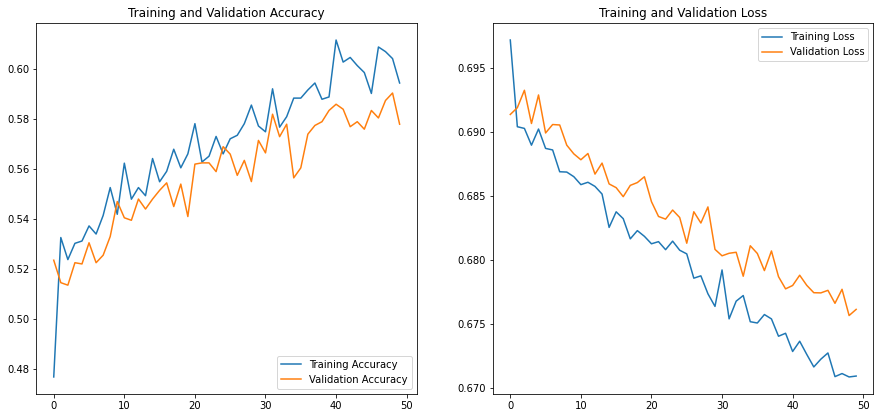

In [9]:
show_learning_graph(history=history, epochs=epochs, verbose=0)

<div style="display: flex; background-color: Green; padding: 7px;" >

### Prédiction
</div>

In [14]:
def test_img(model, img_test, target_size, labels,label_expected,verbose=0):
    img = keras.preprocessing.image.load_img(img_test, target_size=target_size)
    img_array = keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)  # Create batch axis

    predictions = model.predict(img_array)
    predict_class = int(predictions[0][0])
    label = labels[predict_class]

    if label == label_expected:
        return 1, predict_class
    else:
        plt.figure(figsize=(5, 5))
        imread = cv2.imread(img_test)
        plt.imshow(imread)
        plt.title(f"{label_expected} expected (predict_class : {predict_class}), {label} predict")
        plt.show()
        return 0, predict_class

In [ ]:
def test_n_images(model, aurelie_test, aurelie_y, verbose=0):
    success = 0
    fail = 0
    fail_files = []
    predictions = []

    for i in range(0, len(aurelie_test)):
        try:
            found, predict_class = test_img(model=model,img_test=aurelie_test[i], target_size=target_size, labels=labels,label_expected=labels[aurelie_y[i]],verbose=0)
            predictions.append(predict_class)
            
            if found:
                success += 1
            else:
                fail += 1
                fail_files.append(aurelie_test[i])
        except Exception as e:
            print(i, aurelie_test[i], e)
            predictions.append(3)

    df_cm = confusion_matrix(aurelie_y, predictions)
    if verbose:
        sn.set(font_scale=1.4) # for label size
        sn.heatmap(df_cm, annot=True, annot_kws={"size": 16})
    return df_cm, fail_files 

<div style="display: flex; background-color: indigo;" >

#### 1 image
</div>

In [15]:
img_test = r'C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (1).jpeg'

found, predict_class = test_img(model=cnn,img_test=img_test, target_size=target_size, labels=labels,label_expected="dog",verbose=0)

1/1 [==============================] - 0s 26ms/step


<div style="display: flex; background-color: indigo;" >

#### Quelques images
</div>

1/1 [==============================] - 0s 21ms/step


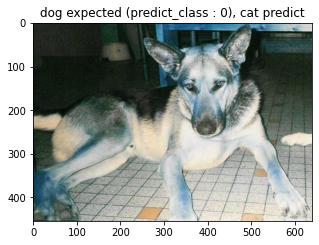

1/1 [==============================] - 0s 21ms/step


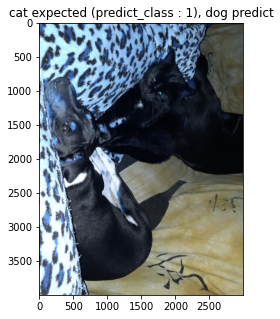

1/1 [==============================] - 0s 21ms/step


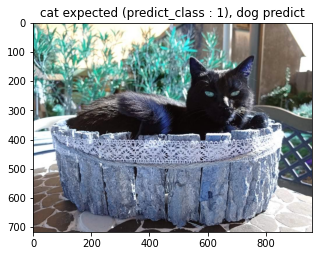

1/1 [==============================] - 0s 20ms/step


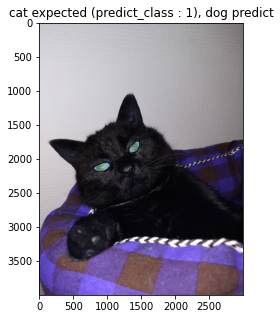

1/1 [==============================] - 0s 21ms/step


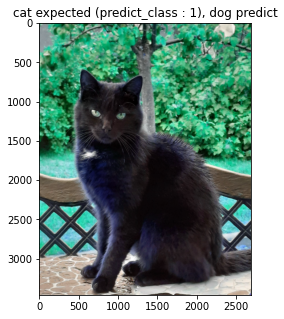

1/1 [==============================] - 0s 20ms/step


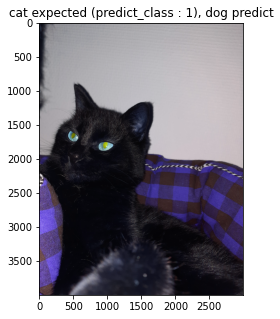

In [16]:
success = 0
fail = 0
fail_files = []
fail_predictions = []
predictions = []

aurelie_test, aurelie_y = get_aurelie_test()

for i in range(0, len(aurelie_test)):
    try:
        found, predict_class = test_img(img_test=aurelie_test[i], target_size=target_size, labels=labels,label_expected=labels[aurelie_y[i]],verbose=0)
        predictions.append(predict_class)
        
        if found:
            success += 1
        else:
            fail += 1
            fail_files.append(aurelie_test[i])
    except Exception as e:
        print(i, aurelie_test[i], e)

<AxesSubplot:>

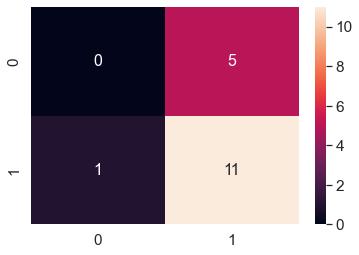

In [19]:
df_cm = confusion_matrix(aurelie_y, predictions)

sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm, annot=True, annot_kws={"size": 16})

<div style="display: flex; background-color: indigo;" >

#### N images
</div>

1/1 [==============================] - 0s 25ms/step


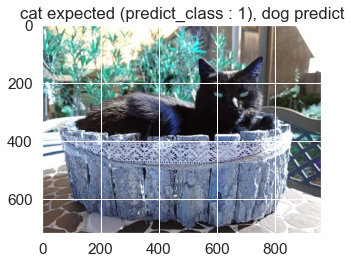

1 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\cat\cat.001 (1).jpg cannot identify image file <_io.BytesIO object at 0x0000028BC9096900>
1/1 [==============================] - 0s 20ms/step


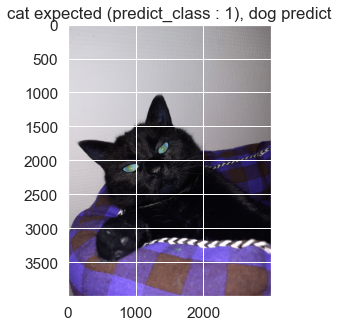

1/1 [==============================] - 0s 21ms/step


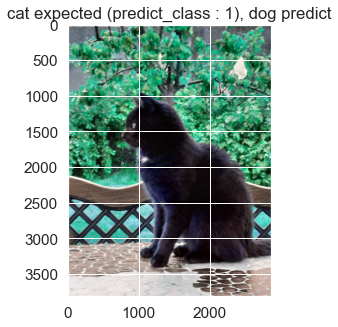

1/1 [==============================] - 0s 21ms/step


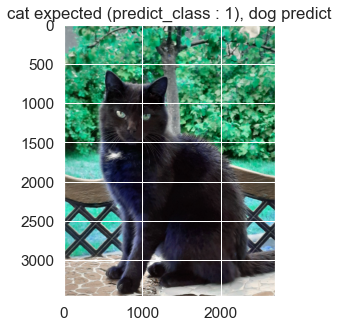

1/1 [==============================] - 0s 19ms/step


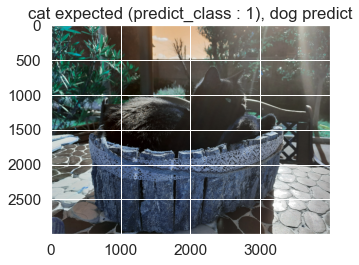

1/1 [==============================] - 0s 21ms/step


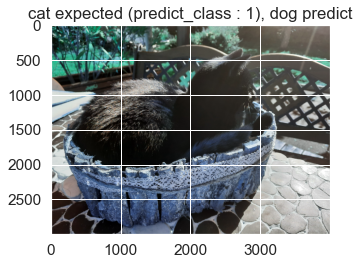

1/1 [==============================] - 0s 54ms/step


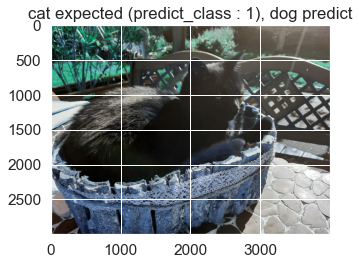

1/1 [==============================] - 0s 19ms/step


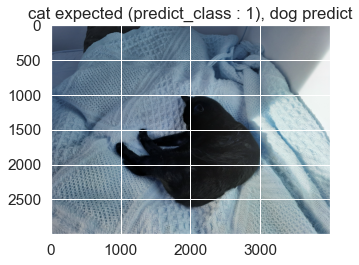

1/1 [==============================] - 0s 18ms/step


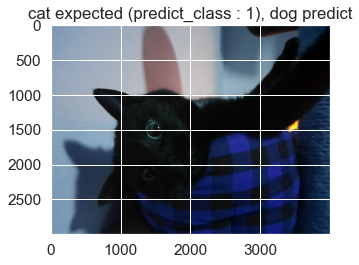

1/1 [==============================] - 0s 19ms/step


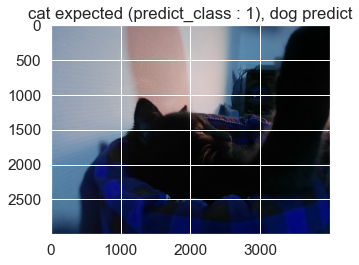

1/1 [==============================] - 0s 21ms/step


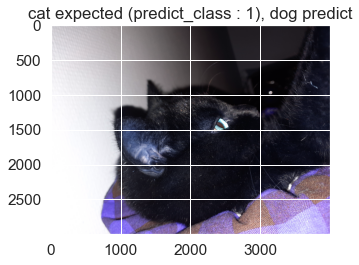

1/1 [==============================] - 0s 18ms/step


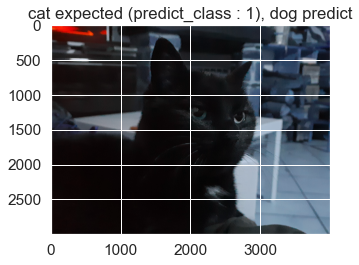

1/1 [==============================] - 0s 21ms/step


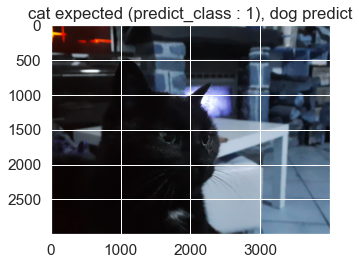

1/1 [==============================] - 0s 19ms/step


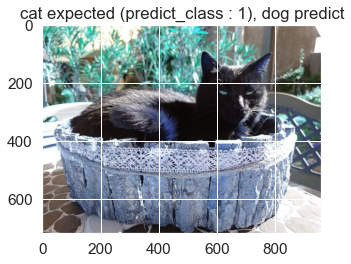

1/1 [==============================] - 0s 23ms/step


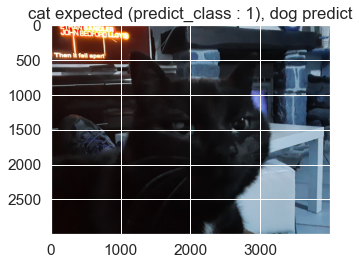

1/1 [==============================] - 0s 19ms/step


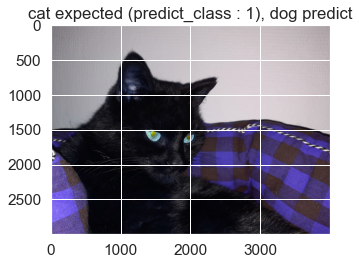

1/1 [==============================] - 0s 19ms/step


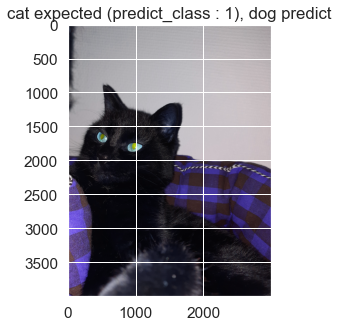

1/1 [==============================] - 0s 19ms/step


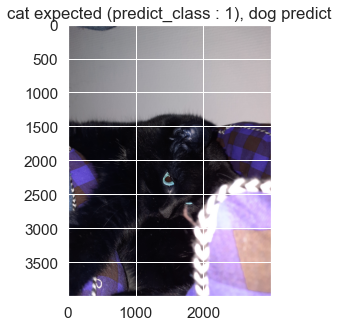

1/1 [==============================] - 0s 23ms/step


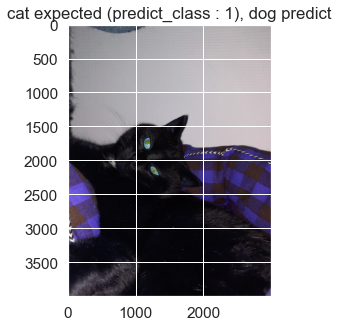

1/1 [==============================] - 0s 21ms/step


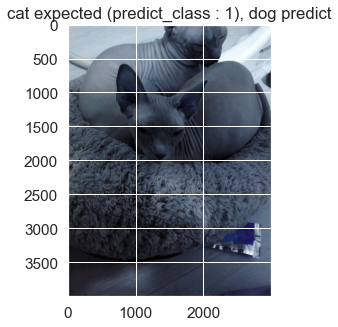

1/1 [==============================] - 0s 22ms/step


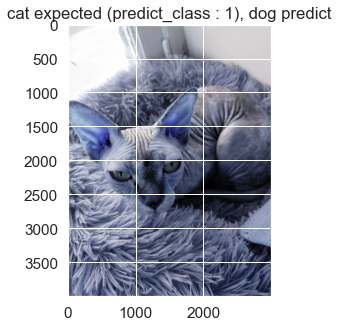

1/1 [==============================] - 0s 20ms/step


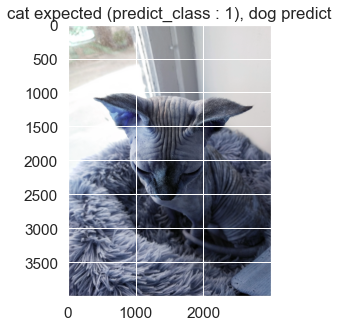

1/1 [==============================] - 0s 26ms/step


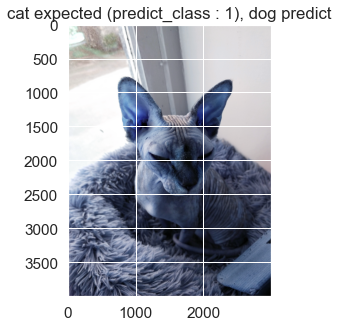

1/1 [==============================] - 0s 20ms/step


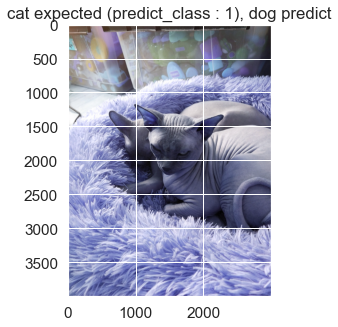

1/1 [==============================] - 0s 18ms/step


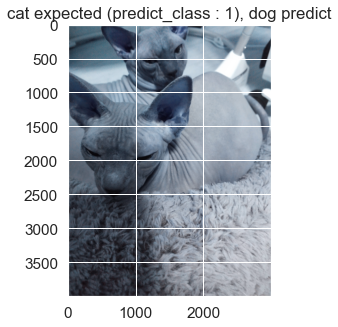

1/1 [==============================] - 0s 16ms/step


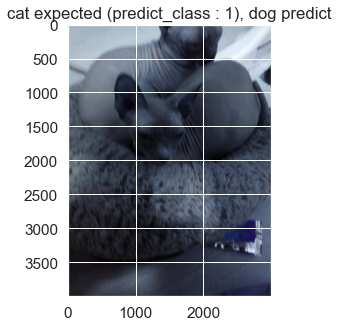

1/1 [==============================] - 0s 21ms/step


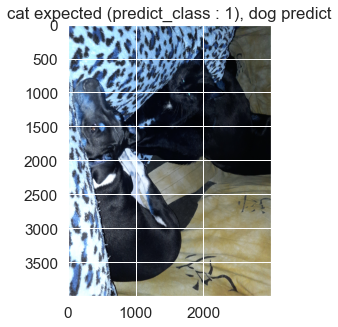

1/1 [==============================] - 0s 20ms/step


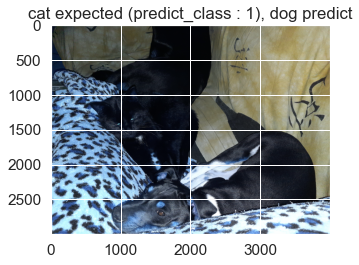

1/1 [==============================] - 0s 20ms/step


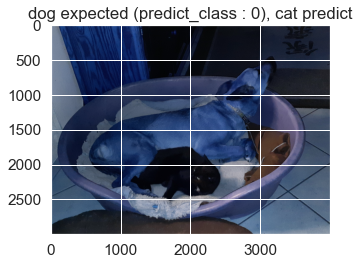

1/1 [==============================] - 0s 31ms/step


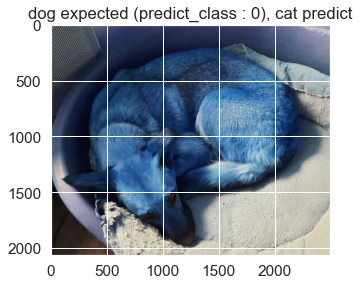

1/1 [==============================] - 0s 20ms/step
64 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (140).jpg broken data stream when reading image file
1/1 [==============================] - 0s 20ms/step
91 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (165).jpg broken data stream when reading image file
1/1 [==============================] - 0s 21ms/step
94 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (168).jpg broken data stream when reading image file
1/1 [==============================] - 0s 18ms/step


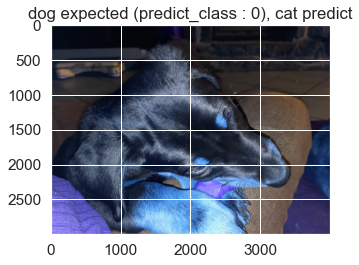

1/1 [==============================] - 0s 18ms/step


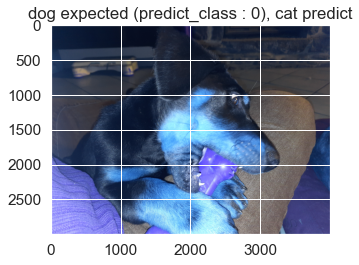

1/1 [==============================] - 0s 16ms/step


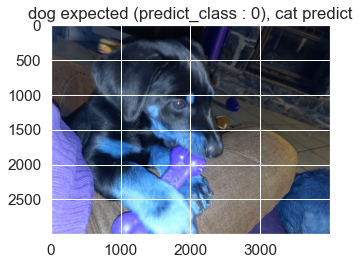

1/1 [==============================] - 0s 65ms/step


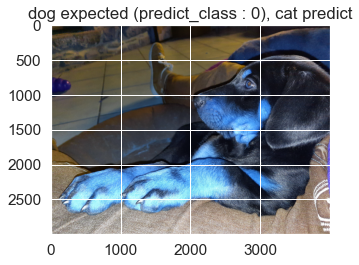

1/1 [==============================] - 0s 19ms/step
173 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (240).jpg broken data stream when reading image file
1/1 [==============================] - 0s 22ms/step


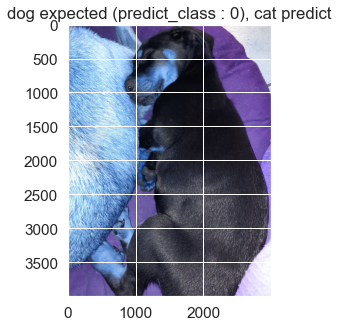

1/1 [==============================] - 0s 21ms/step


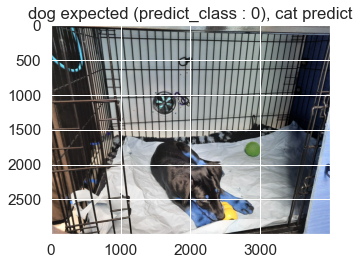

1/1 [==============================] - 0s 18ms/step
221 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (288).jpg broken data stream when reading image file
1/1 [==============================] - 0s 20ms/step


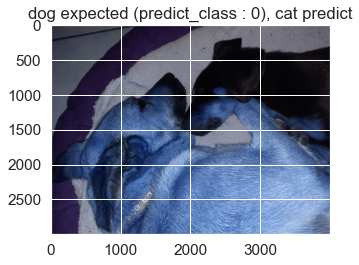

1/1 [==============================] - 0s 19ms/step


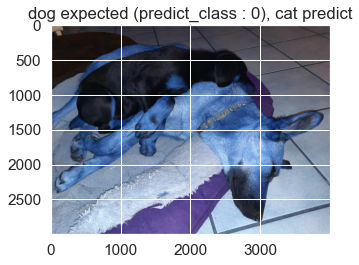

1/1 [==============================] - 0s 19ms/step


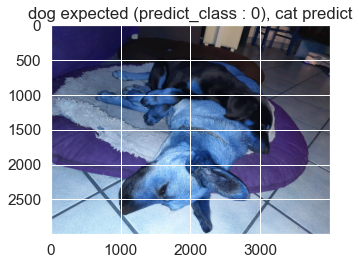

1/1 [==============================] - 0s 25ms/step


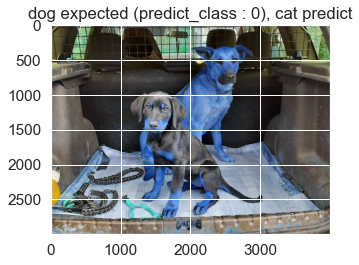

1/1 [==============================] - 0s 19ms/step
255 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (332).jpg broken data stream when reading image file
1/1 [==============================] - 0s 26ms/step
327 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (405).jpg broken data stream when reading image file
1/1 [==============================] - 0s 17ms/step


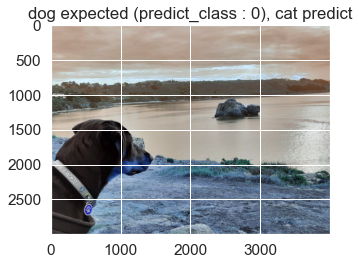

1/1 [==============================] - 0s 24ms/step


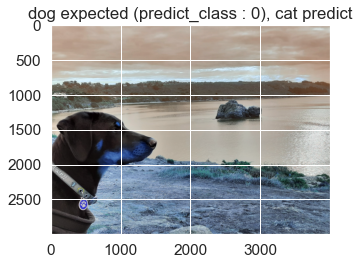

1/1 [==============================] - 0s 18ms/step
379 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (457).jpg broken data stream when reading image file
1/1 [==============================] - 0s 19ms/step
386 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (47).jpg cannot identify image file <_io.BytesIO object at 0x0000028BC8512900>
1/1 [==============================] - 0s 18ms/step
394 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (48).jpg cannot identify image file <_io.BytesIO object at 0x0000028BC47C1DB0>
1/1 [==============================] - 0s 20ms/step


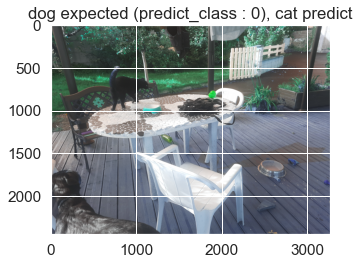

1/1 [==============================] - 0s 20ms/step
410 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (494).jpg broken data stream when reading image file
1/1 [==============================] - 0s 18ms/step
441 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (522).jpg broken data stream when reading image file
1/1 [==============================] - 0s 20ms/step


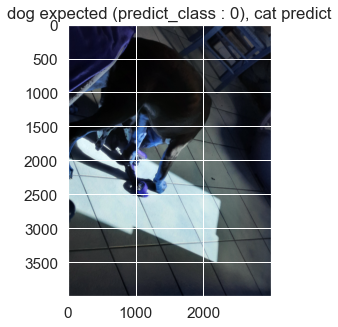

1/1 [==============================] - 0s 29ms/step


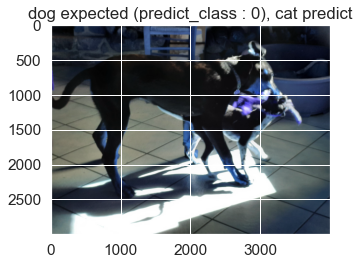

1/1 [==============================] - 0s 126ms/step


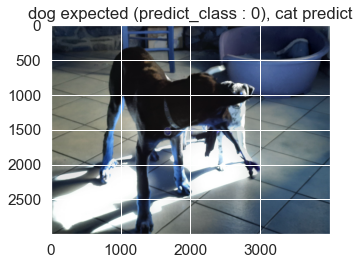

1/1 [==============================] - 0s 28ms/step


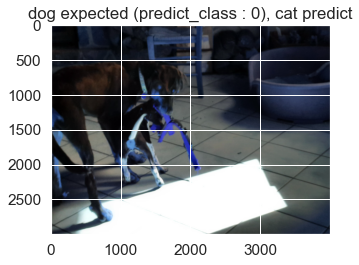

1/1 [==============================] - 0s 23ms/step


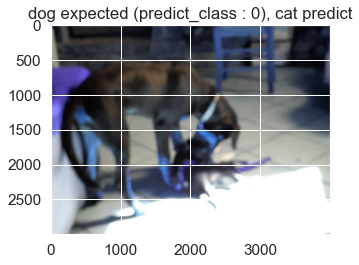

1/1 [==============================] - 0s 47ms/step
472 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (550).jpg broken data stream when reading image file
1/1 [==============================] - 0s 21ms/step


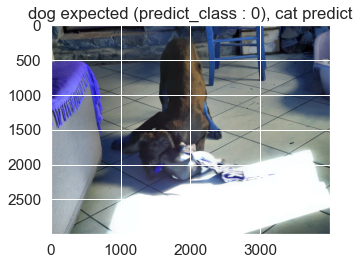

1/1 [==============================] - 0s 122ms/step


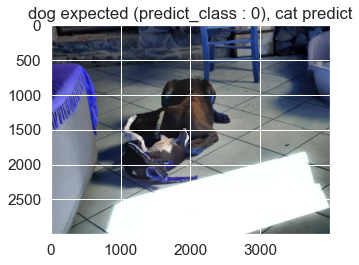

1/1 [==============================] - 0s 21ms/step


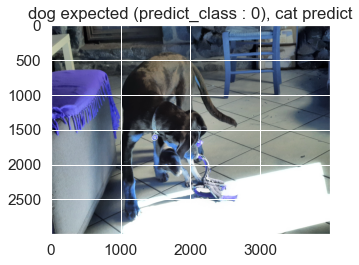

1/1 [==============================] - 0s 24ms/step


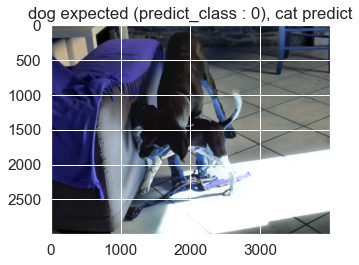

1/1 [==============================] - 0s 23ms/step
540 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (614).jpg broken data stream when reading image file
1/1 [==============================] - 0s 24ms/step
560 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (64).jpg cannot identify image file <_io.BytesIO object at 0x0000028BC8724720>
1/1 [==============================] - 0s 24ms/step
567 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (65).jpg cannot identify image file <_io.BytesIO object at 0x0000028B92670C20>
1/1 [==============================] - 0s 20ms/step
571 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (653).jpg broken data stream when reading image file
1/1 [==============================] - 0s 19ms/step
584 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_o

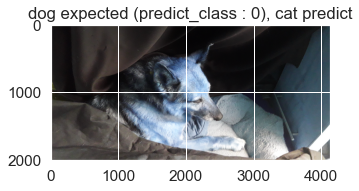

1/1 [==============================] - 0s 20ms/step


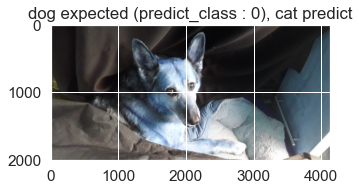

1/1 [==============================] - 0s 19ms/step
604 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (685).jpg broken data stream when reading image file
1/1 [==============================] - 0s 18ms/step
610 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (690).jpg broken data stream when reading image file
1/1 [==============================] - 0s 18ms/step
616 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (696).jpg broken data stream when reading image file
1/1 [==============================] - 0s 18ms/step
634 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (729).jpg broken data stream when reading image file
1/1 [==============================] - 0s 18ms/step


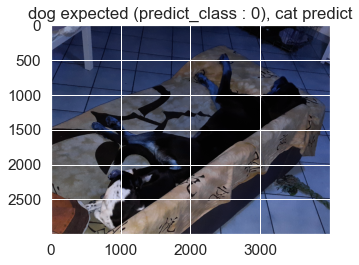

1/1 [==============================] - 0s 19ms/step


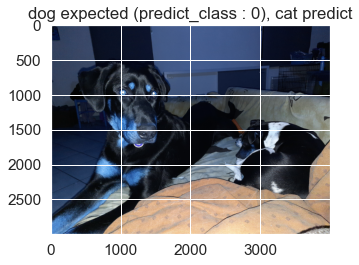

1/1 [==============================] - 0s 23ms/step


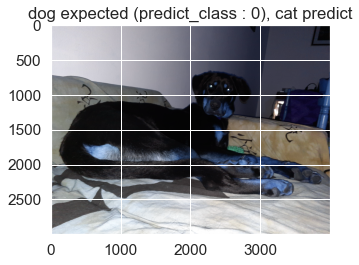

1/1 [==============================] - 0s 17ms/step


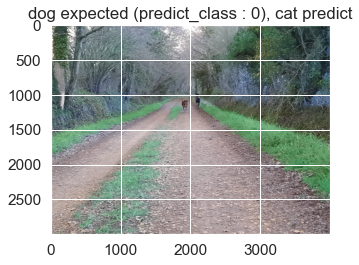

1/1 [==============================] - 0s 19ms/step


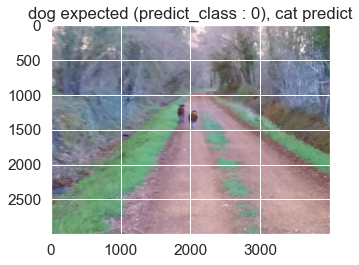

1/1 [==============================] - 0s 19ms/step


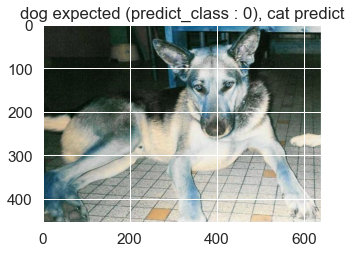

1/1 [==============================] - 0s 19ms/step


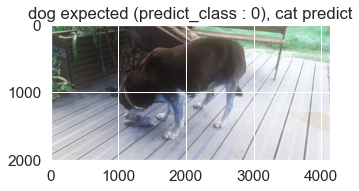

1/1 [==============================] - 0s 19ms/step


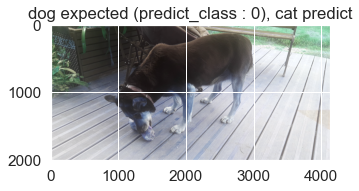

1/1 [==============================] - 0s 18ms/step
803 C:\Users\User\WORK\workspace-ia\PROJETS\projet_cat_or_dog\dataset\aurelie_validation_set\dog\dog.001 (886).jpg broken data stream when reading image file
1/1 [==============================] - 0s 20ms/step


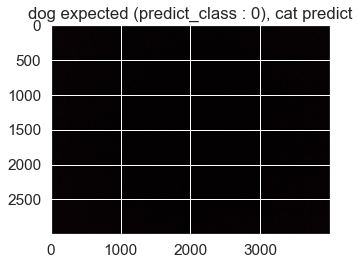

1/1 [==============================] - 0s 19ms/step


In [29]:
success = 0
fail = 0
fail_files = []
fail_predictions = []
predictions = []

aurelie_test, aurelie_y = get_aurelie_full_test(label_codes=training_set.class_indices, verbose=0)

for i in range(0, len(aurelie_test)):
    try:
        found, predict_class = test_img(img_test=aurelie_test[i], target_size=target_size, labels=labels,label_expected=labels[aurelie_y[i]],verbose=0)
        predictions.append(predict_class)
        
        if found:
            success += 1
        else:
            fail += 1
            fail_files.append(aurelie_test[i])
    except Exception as e:
        print(i, aurelie_test[i], e)
        predictions.append(-1)

df_cm = confusion_matrix(aurelie_y, predictions)

sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm, annot=True, annot_kws={"size": 16})

<AxesSubplot:>

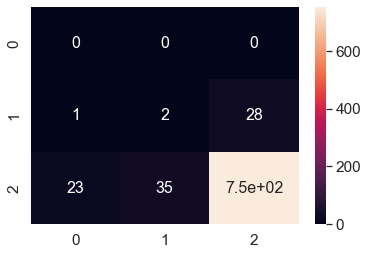

In [30]:
df_cm = confusion_matrix(aurelie_y, predictions)

sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm, annot=True, annot_kws={"size": 16})

<div style="display: flex; background-color: blue;" >

# 3.Modèle ResNet50 en utilisation directe
</div>

In [31]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

<div style="display: flex; background-color: Green; padding: 7px;" >

### Modèle
</div>

In [33]:
model = ResNet50(weights='imagenet')

102967424/102967424 [==============================] - 10s 0us/step


<div style="display: flex; background-color: Green; padding: 7px;" >

### Prediction une image
</div>

In [32]:
img_test

'C:\\Users\\User\\WORK\\workspace-ia\\PROJETS\\projet_cat_or_dog\\dataset\\aurelie_validation_set\\dog\\dog.001 (1).jpeg'

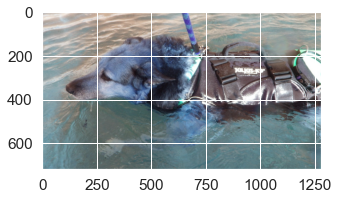

In [35]:
plt.figure(figsize=(5, 5))
imread = cv2.imread(img_test)
plt.imshow(imread)
plt.show()

In [34]:
img = image.load_img(img_test, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = model.predict(x)

# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', decode_predictions(preds, top=3)[0])

35363/35363 [==============================] - 0s 1us/step
Predicted: [('n02102318', 'cocker_spaniel', 0.07705149), ('n02106550', 'Rottweiler', 0.07325226), ('n02102480', 'Sussex_spaniel', 0.07100144)]


<div style="display: flex; background-color: Green; padding: 7px;" >

### Prediction quelques images
</div>

In [39]:
success = 0
fail = 0
fail_files = []
fail_predictions = []
predictions = []

aurelie_test, aurelie_y = get_aurelie_test()

for i in range(0, len(aurelie_test)):
    try:

        img = image.load_img(img_test, target_size=(224, 224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)

        preds = model.predict(x)
        # decode the results into a list of tuples (class, description, probability)
        # (one such list for each sample in the batch)

        preds =  decode_predictions(preds, top=3)[0]


        print('Predicted:',preds)
        
        # predictions.append(predict_class)
        
        # if found:
        #     success += 1
        # else:
        #     fail += 1
        #     fail_files.append(aurelie_test[i])
    except Exception as e:
        print(i, aurelie_test[i], e)
        predictions.append(-1)

1/1 [==============================] - 0s 111ms/step
Predicted: [('n02102318', 'cocker_spaniel', 0.07705149), ('n02106550', 'Rottweiler', 0.07325226), ('n02102480', 'Sussex_spaniel', 0.07100144)]
1/1 [==============================] - 0s 108ms/step
Predicted: [('n02102318', 'cocker_spaniel', 0.07705149), ('n02106550', 'Rottweiler', 0.07325226), ('n02102480', 'Sussex_spaniel', 0.07100144)]
1/1 [==============================] - 0s 99ms/step
Predicted: [('n02102318', 'cocker_spaniel', 0.07705149), ('n02106550', 'Rottweiler', 0.07325226), ('n02102480', 'Sussex_spaniel', 0.07100144)]
1/1 [==============================] - 0s 95ms/step
Predicted: [('n02102318', 'cocker_spaniel', 0.07705149), ('n02106550', 'Rottweiler', 0.07325226), ('n02102480', 'Sussex_spaniel', 0.07100144)]
1/1 [==============================] - 0s 116ms/step
Predicted: [('n02102318', 'cocker_spaniel', 0.07705149), ('n02106550', 'Rottweiler', 0.07325226), ('n02102480', 'Sussex_spaniel', 0.07100144)]
1/1 [=================